# Extraction Features d'Images via Transfer Learning
Vu que les résultats du clustering sur les features d'images extraites via SIFT & ORB ne produisent pas des résultats assez satisfaisant nous allons tester une méthode d'extraction de features à l'aide d'un réseau de neurone pré-entrainé (Transer Learning). 
[Source](https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/?utm_medium=email&utm_content=nov-18-has-completed-mentoring-session-student&bsft_clkid=69552619-a88e-42e1-8ba9-0dce105e3cd6&bsft_uid=51587838-182a-40d2-b9d7-78728e017104&bsft_mid=8c6b0705-d295-495d-9e61-f27b77e9e293&bsft_eid=7244055d-47f0-a6f2-c394-7a20ebb3a726&bsft_txnid=39b33dc8-964d-4eea-8540-ab265ba185ce&bsft_mime_type=html&bsft_ek=2021-10-19T18%3A44%3A41Z&bsft_aaid=a265d396-7432-4eb2-9c9a-ba5eea75629e&bsft_tv=10)
## Sommaire :
- [A - Extraction de features ](#A)
- [B - Classification](#B)
- [C - Visualisations t-SNE](#C)
- [D - Réduction de dimension](#D)
- [E - Clustering & Visualisations t-SNE après réduction de dimension](#E)
## Chargement des bibliothèques & fichiers

In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn import decomposition
from sklearn import preprocessing

In [2]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16
from keras.models import Model
#from pickle import dump

In [3]:
#chargement de la liste des images
data = pd.read_csv("Data/desc.csv")
data=data[['uniq_id','image']]
data

,uniq_id,image
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,6325b6870c54cd47be6ebfbffa620ec7.jpg
...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046,fd6cbcc22efb6b761bd564c28928483c,fd6cbcc22efb6b761bd564c28928483c.jpg
1047,5912e037d12774bb73a2048f35a00009,5912e037d12774bb73a2048f35a00009.jpg
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg


## A - Extraction de features <a name=A ></a>

In [4]:
#extraction des features pour chaques images
col = []
# load model
model = VGG16()
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

for pict in data['image']:
    #chargement images
    path = './Data/Images/'+pict
    
    # load an image from file
    image = load_img(path, target_size=(224, 224))
    # convert the image pixels to a numpy array
    image = img_to_array(image)
    # reshape data for the model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # prepare the image for the VGG model
    image = preprocess_input(image)
    # get extracted features
    features = model.predict(image)
    
    col.append(features)

C:\ProgramData\Anaconda3\lib\site-packages\PIL\Image.py:2834: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [5]:
#insertion de l'array des features pour chaques images
data.insert(len(data.columns),'features',col)
data

,uniq_id,image,features
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[[3.3986144, 0.8595722, 0.0, 1.1065603, 2.2661..."
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[[0.0, 0.0, 0.0, 1.172009, 0.0, 0.0, 0.0, 0.0,..."
2,64d5d4a258243731dc7bbb1eef49ad74,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[[0.0, 0.0, 0.0, 4.457807, 0.0, 0.0, 0.0, 0.0,..."
3,d4684dcdc759dd9cdf41504698d737d8,d4684dcdc759dd9cdf41504698d737d8.jpg,"[[0.0, 0.07099098, 0.0, 2.046283, 0.0, 0.0, 0...."
4,6325b6870c54cd47be6ebfbffa620ec7,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[[3.4171524, 0.0, 0.0, 0.0, 1.012359, 0.0, 0.0..."
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,958f54f4c46b53c8a0a9b8167d9140bc.jpg,"[[2.3122683, 2.432937, 0.0, 1.8605157, 3.10123..."
1046,fd6cbcc22efb6b761bd564c28928483c,fd6cbcc22efb6b761bd564c28928483c.jpg,"[[1.2171843, 0.36527532, 0.33084857, 0.0, 2.14..."
1047,5912e037d12774bb73a2048f35a00009,5912e037d12774bb73a2048f35a00009.jpg,"[[2.1961298, 2.3982751, 2.6236405, 0.98388195,..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.38886473, 0.0, 0...."


In [6]:
#création d'une liste contenant toutes les features, descripteurs, de toutes les images
dico = []
for img in range(len(data)):
    for des in data['features'][img]:
        dico.append(des)

dico

[array([3.3986144, 0.8595722, 0.       , ..., 0.       , 0.8510551,
        0.       ], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([0.       , 0.       , 0.       , ..., 1.2970998, 0.       ,
        0.       ], dtype=float32),
 array([0.        , 0.07099098, 0.        , ..., 0.        , 0.        ,
        0.        ], dtype=float32),
 array([3.4171524, 0.       , 0.       , ..., 0.       , 1.7359502,
        0.       ], dtype=float32),
 array([0.0182355, 0.       , 0.       , ..., 6.2829995, 0.       ,
        2.1521003], dtype=float32),
 array([0.       , 0.       , 0.       , ..., 3.2450442, 0.       ,
        0.3453858], dtype=float32),
 array([0.82443154, 0.        , 0.        , ..., 1.2805882 , 0.        ,
        0.        ], dtype=float32),
 array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
 array([2.6603994 , 1.8068607 , 0.        , ..., 3.252704  , 0.        ,
        0.75433356], dtype=float32),
 array([0.9896952, 0.       , 0.       , .

## B - Classification <a name=B ></a>
Maintenant qu'on a extrait nos features des images on va réaliser une classification des images

In [7]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

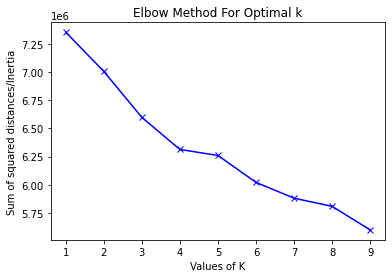

In [8]:
Sum_of_squared_distances = []
#on fixe la plage de valeur que peut prendre k, le nombre de clusters
K = range(1,10) #[175,275,300,325,350,525,700,875]range(1,10) 

#on effectue la kmeans pour chaque valeurs de k, en prennant soin de fixer un random_state
for num_clusters in K : 
    kmeans = MiniBatchKMeans(n_clusters=num_clusters, random_state=5)
    kmeans.fit(dico)
    Sum_of_squared_distances.append(kmeans.inertia_)

plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [9]:
#kmeans sur l'ensemble des descripteurs 
kmeans = MiniBatchKMeans(n_clusters=7, random_state=5)
kmeans.fit(dico)

MiniBatchKMeans(n_clusters=7, random_state=5)

In [10]:
data['features'] = data['features'].apply(lambda x: x.astype(float))

In [11]:
int(kmeans.predict(data['features'][0]))

1

In [12]:
#kmean.predict sur les descripteurs de chaques images
data['predBoW'] = data['features'].apply(lambda x: int(kmeans.predict(x)))
data

,uniq_id,image,features,predBoW
0,55b85ea15a1536d46b7190ad6fff8ce7,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[[3.3986144065856934, 0.859572172164917, 0.0, ...",1
1,7b72c92c2f6c40268628ec5f14c6d590,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[[0.0, 0.0, 0.0, 1.172008991241455, 0.0, 0.0, ...",0
2,64d5d4a258243731dc7bbb1eef49ad74,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[[0.0, 0.0, 0.0, 4.4578070640563965, 0.0, 0.0,...",0
3,d4684dcdc759dd9cdf41504698d737d8,d4684dcdc759dd9cdf41504698d737d8.jpg,"[[0.0, 0.07099097967147827, 0.0, 2.04628300666...",1
4,6325b6870c54cd47be6ebfbffa620ec7,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[[3.4171524047851562, 0.0, 0.0, 0.0, 1.0123590...",1
...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,958f54f4c46b53c8a0a9b8167d9140bc.jpg,"[[2.3122682571411133, 2.432936906814575, 0.0, ...",1
1046,fd6cbcc22efb6b761bd564c28928483c,fd6cbcc22efb6b761bd564c28928483c.jpg,"[[1.21718430519104, 0.3652753233909607, 0.3308...",1
1047,5912e037d12774bb73a2048f35a00009,5912e037d12774bb73a2048f35a00009.jpg,"[[2.19612979888916, 2.398275136947632, 2.62364...",1
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.3888647258281708,...",1


Constitution d'un dataframe contenant les features de chaques images :

In [13]:
df_features = pd.DataFrame(data['features'][0])
for i in range(1,len(data)):
    df_features = df_features.append(pd.DataFrame(data['features'][i]))
    
df_features = df_features.reset_index(drop=True)
df_features

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,3.398614,0.859572,0.000000,1.106560,2.266122,2.927241,2.446448,0.000000,0.000000,0.000000,...,0.485876,0.0,0.000000,0.472938,0.875756,0.783684,0.000000,0.000000,0.851055,0.000000
1,0.000000,0.000000,0.000000,1.172009,0.000000,0.000000,0.000000,0.000000,0.000000,6.499799,...,1.169696,0.0,0.000000,0.000000,0.000000,3.152507,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,4.457807,0.000000,0.000000,0.000000,0.000000,0.000000,2.820566,...,0.000000,0.0,0.000000,0.000000,0.000000,5.270284,0.000000,1.297100,0.000000,0.000000
3,0.000000,0.070991,0.000000,2.046283,0.000000,0.000000,0.000000,0.000000,0.000000,0.894023,...,0.000000,0.0,0.000000,0.000000,0.000000,3.977747,0.000000,0.000000,0.000000,0.000000
4,3.417152,0.000000,0.000000,0.000000,1.012359,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,9.195916,0.139736,0.000000,1.735950,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,2.312268,2.432937,0.000000,1.860516,3.101232,2.369040,0.000000,0.000000,1.428848,1.286600,...,0.000000,0.0,0.058723,0.000000,0.000000,0.000000,0.859425,1.085387,0.000000,0.000000
1046,1.217184,0.365275,0.330849,0.000000,2.140628,0.000000,0.000000,0.767264,0.000000,3.563397,...,0.000000,0.0,0.837411,0.839075,0.000000,1.042109,0.000000,1.560315,0.000000,0.998342
1047,2.196130,2.398275,2.623641,0.983882,0.366652,0.535506,3.730995,0.000000,0.000000,0.000000,...,1.230694,0.0,0.000000,0.000000,0.000000,0.193308,0.546066,2.159872,0.184722,0.000000
1048,0.000000,0.000000,0.000000,0.000000,0.000000,0.388865,0.000000,0.000000,0.000000,1.612164,...,0.974809,0.0,2.205197,2.729846,0.000000,0.000000,0.000000,0.000000,0.248330,0.925138


On normalise les features :

In [14]:
from sklearn import preprocessing

In [15]:
std_scale = preprocessing.StandardScaler().fit(df_features)
features_scaled = std_scale.transform(df_features)
features_scaled=pd.DataFrame(features_scaled)
features_scaled

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,1.758574,0.133247,-0.406322,-0.049365,1.616812,2.240036,0.691576,-0.438637,-0.160844,-0.816505,...,-0.006756,-0.270872,-0.180669,0.219275,0.325423,-0.254703,-0.465890,-0.496757,0.313549,-0.640967
1,-0.434478,-0.429830,-0.406322,-0.015804,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,1.396520,...,0.522652,-0.270872,-0.180669,-0.355372,-0.442959,1.012508,-0.465890,-0.496757,-0.381959,-0.640967
2,-0.434478,-0.429830,-0.406322,1.669109,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,0.143830,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,2.145420,-0.465890,0.228407,-0.381959,-0.640967
3,-0.434478,-0.383326,-0.406322,0.432512,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,-0.512112,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,1.453973,-0.465890,-0.496757,-0.381959,-0.640967
4,1.770536,-0.429830,-0.406322,-0.616795,0.481018,-0.405801,-0.551783,-0.438637,-0.160844,-0.816505,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,4.245452,-0.355851,-0.496757,1.036711,-0.640967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,1.057578,1.163907,-0.406322,0.337253,2.373344,1.735497,-0.551783,-0.438637,2.710876,-0.378449,...,-0.382917,-0.270872,-0.046791,-0.355372,-0.442959,-0.673938,0.210891,0.110046,-0.381959,-0.640967
1046,0.350944,-0.190550,-0.051055,-0.616795,1.503126,-0.405801,-0.551783,-0.012143,-0.160844,0.396746,...,-0.382917,-0.270872,1.728476,0.664154,-0.442959,-0.116458,-0.465890,0.375562,-0.381959,-0.057834
1047,0.982637,1.141201,2.410956,-0.112273,-0.103934,0.078226,1.344422,-0.438637,-0.160844,-0.816505,...,0.569876,-0.270872,-0.180669,-0.355372,-0.442959,-0.570527,-0.035873,0.710754,-0.230999,-0.640967
1048,-0.434478,-0.429830,-0.406322,-0.616795,-0.436087,-0.054319,-0.551783,-0.438637,-0.160844,-0.267602,...,0.371772,-0.270872,4.846781,2.961553,-0.442959,-0.673938,-0.465890,-0.496757,-0.179016,-0.100592


In [78]:
features_scaled.to_csv("Data/bovw_cnn.csv", index = False)

In [16]:
#récupération des catégories de chaques produits
categ = pd.read_csv("Data/data_txt.csv")
categ = categ['clean_category']
categ

0       HomeFurnishing
1             BabyCare
2             BabyCare
3       HomeFurnishing
4       HomeFurnishing
             ...      
1045          BabyCare
1046          BabyCare
1047          BabyCare
1048          BabyCare
1049          BabyCare
Name: clean_category, Length: 1050, dtype: object

### C - Visualisations t-SNE <a name=C ></a>

In [17]:
from sklearn.manifold import TSNE

In [18]:
tsne = TSNE(perplexity=40, random_state=5)
tsne_results = tsne.fit_transform(features_scaled)
tsne_proj = tsne_results

In [19]:
tsne_results = pd.DataFrame(tsne_results)
tsne_results

,0,1
0,20.667204,15.052350
1,4.687367,12.010821
2,2.987737,17.436228
3,13.525153,21.128704
4,15.881312,26.466135
...,...,...
1045,20.679350,16.305941
1046,8.302635,4.447416
1047,13.031359,10.239678
1048,7.989091,5.103067


In [20]:
color = ['purple','deepskyblue','red','chocolate','darkorange','forestgreen','royalblue']

Visualisation t-SNE en coloriant les produits suivant leur catégorie :

<AxesSubplot:xlabel='0', ylabel='1'>

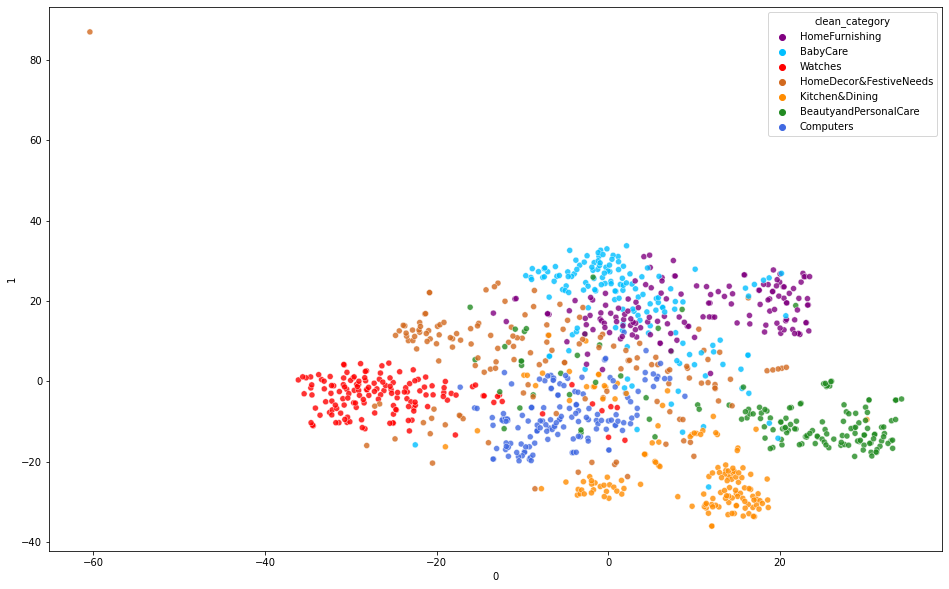

In [21]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=tsne_results[0], y=tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

On remarque que les images des produits se regroupent bien suivant leurs catégories. Contrairement à la projection t-SNE réalisé avec l'extraction des features avec SIFT & ORB. On va maintenant voir si les classes prédites avec le k-means se rapprochent ou pas de ce découpage. <br>

Visualisation t-SNE en coloriant les produits suivant la classe prédite par le k-means :

<AxesSubplot:xlabel='0', ylabel='1'>

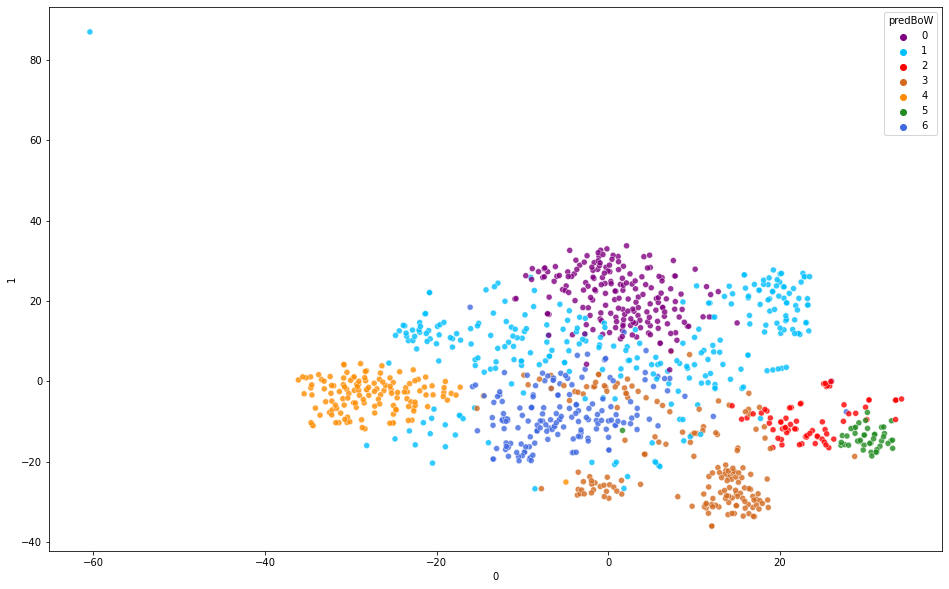

In [22]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=tsne_results[0], y=tsne_results[1],
    hue=data['predBoW'],
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

On observe ici que les classes prédites via le k-means se rapprochent fortement des catégories de produits que l'on s'attend à obtenir. Par exemple on peut effectuer les rapprochements suivant :
- BabyCare (bleu ciel) -> Classe 0 (violet)
- Watches (rouge) -> Classe 4 (jaune)
- Computers (bleu foncé) -> Classe 6 (bleu foncé)
- Kitchen&Dining (jaune) -> Classe 3 (marron)
Par contre on remarque quand même quelques différences :
- La Classe 1 (bleu clair) contient une partie des individus de HomeFurnishing (violet) mais aussi des individus de HomeDecors&FestiveNeeds et d'autres individus, ce qui peux en partie s'expliquer par le fait que les produits de ces 2 catégories semblent proches, en effet il s'agit de produits en rapport avec la Maison (décorations, fourniture de maison,...)
- Les Classes 2 & 5 qui font référence à la même catégorie BeautyAndPersonalCare. Peut-être que cette catégorie contient des produits qui sont visuellement différents et qui peuvent se scinder en 2 sous-catégories ? On va pouvoir investiguer plus précisement par la suite en affichant les images des produits sur le t-SNE. <br>

On peut aussi calculer l'Adjusted Rand Score qui va nous renseigner sur le taux d'individus qui font partie des catégories prévues :
- ARS = 1 : toutes les catégories prédites sont exactement les mêmes que les catégories attendues pour tout les individus. 
- ARS = -1 : les catégories prédites ne sont pas les mêmes que les catégories attendues pour tout les individus

In [23]:
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(categ,data['predBoW'])

0.47777881544908984

Avec un Adjusted Rand Score de 0.48 on peut confirmer les observations faites sur les visualisations t-SNE. Beaucoup d'individus se retrouvent dans des classes très similaires aux catégories attendues sauf pour une partie des individus. 
### Affichage des images des produits sur le t-SNE
On va maintenant regarder un peut plus en détail la projection t-SNE en affichant les images des produits pour essayer de comprendre pourquoi certains individus ne sont pas classés dans les catégories attendues.

In [29]:
from matplotlib.collections import LineCollection
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import cv2

In [30]:
#fonction qui projette les images sur le t-SNE
def visualize_scatter_with_images(X_2d_data, images, figsize=(100,100), image_zoom=1,xlim=[-70,40],ylim=[-40,100]):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    plt.show()

In [31]:
images = []
for pict in data['image']:
    #chargement images
    path = 'Data/Images/'+pict
    img = cv2.imread(path,0)
    img = cv2.resize(img, (75,75))
    img = img.flatten()
    images.append(img)
    
images = np.array(images)

In [32]:
images = [np.reshape(i, (75,75)) for i in images]

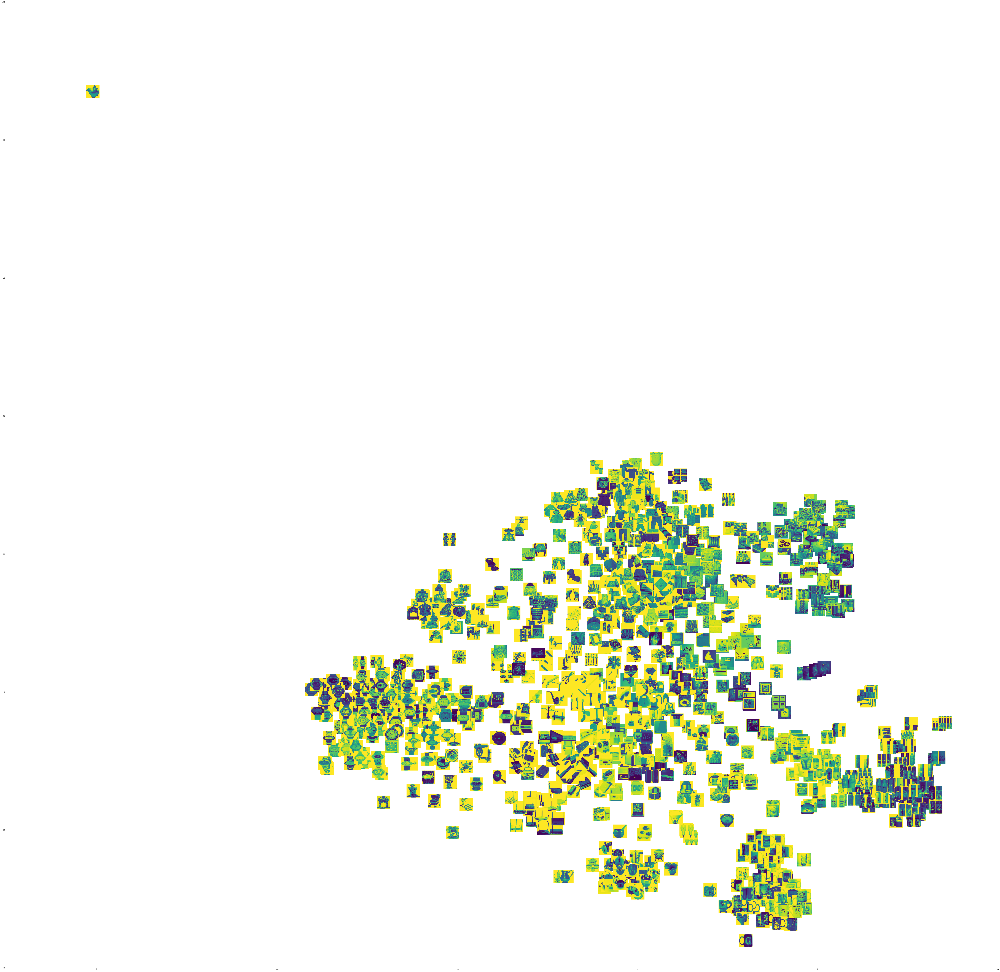

In [33]:
visualize_scatter_with_images(tsne_proj, images)

On peut observer que l'algorithme à mis ensemble des produits qui font référence à la maison comme les décorations et les fournitures de maison. Quand on zoom sur l'image on peut voir que HomeFurnishing contient surtout du linge de maison et des images de lits que l'algorithme rapproche de la décoration d'intérieur. On peut aussi voir pourquoi l'algorithme à créée 2 catégories différentes pour BeautyAndPersonalCare, quand on regarde en détail on remarque que cette catégorie contient des images de déodorants qui pour la plupart affichent 2 photos du même produit sur la même photo et qui sont plus sombre que l'autre partie de la catégorie qui montre d'autres produits de beauté plus clair et de forme différente. <br>

## D - Réduction de dimension <a name=D ></a>
On va maintenant effectuer une réduction de dimension sur le dataframe des features extraites.

In [34]:
features_scaled

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,1.758574,0.133247,-0.406322,-0.049365,1.616812,2.240036,0.691576,-0.438637,-0.160844,-0.816505,...,-0.006756,-0.270872,-0.180669,0.219275,0.325423,-0.254703,-0.465890,-0.496757,0.313549,-0.640967
1,-0.434478,-0.429830,-0.406322,-0.015804,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,1.396520,...,0.522652,-0.270872,-0.180669,-0.355372,-0.442959,1.012508,-0.465890,-0.496757,-0.381959,-0.640967
2,-0.434478,-0.429830,-0.406322,1.669109,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,0.143830,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,2.145420,-0.465890,0.228407,-0.381959,-0.640967
3,-0.434478,-0.383326,-0.406322,0.432512,-0.436087,-0.405801,-0.551783,-0.438637,-0.160844,-0.512112,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,1.453973,-0.465890,-0.496757,-0.381959,-0.640967
4,1.770536,-0.429830,-0.406322,-0.616795,0.481018,-0.405801,-0.551783,-0.438637,-0.160844,-0.816505,...,-0.382917,-0.270872,-0.180669,-0.355372,-0.442959,4.245452,-0.355851,-0.496757,1.036711,-0.640967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,1.057578,1.163907,-0.406322,0.337253,2.373344,1.735497,-0.551783,-0.438637,2.710876,-0.378449,...,-0.382917,-0.270872,-0.046791,-0.355372,-0.442959,-0.673938,0.210891,0.110046,-0.381959,-0.640967
1046,0.350944,-0.190550,-0.051055,-0.616795,1.503126,-0.405801,-0.551783,-0.012143,-0.160844,0.396746,...,-0.382917,-0.270872,1.728476,0.664154,-0.442959,-0.116458,-0.465890,0.375562,-0.381959,-0.057834
1047,0.982637,1.141201,2.410956,-0.112273,-0.103934,0.078226,1.344422,-0.438637,-0.160844,-0.816505,...,0.569876,-0.270872,-0.180669,-0.355372,-0.442959,-0.570527,-0.035873,0.710754,-0.230999,-0.640967
1048,-0.434478,-0.429830,-0.406322,-0.616795,-0.436087,-0.054319,-0.551783,-0.438637,-0.160844,-0.267602,...,0.371772,-0.270872,4.846781,2.961553,-0.442959,-0.673938,-0.465890,-0.496757,-0.179016,-0.100592


In [35]:
# Calcul des composantes principales
pca = decomposition.PCA()
pca.fit(features_scaled.T)

PCA()

In [36]:
#nombre de composantes calculées
n_comp=pca.n_components_
n_comp

1050

In [37]:
#variance expliquée / eigen values
eigval=pca.explained_variance_
pd.DataFrame(eigval)

,0
0,4.625583e+01
1,4.243314e+01
2,3.411059e+01
3,2.850995e+01
4,2.586984e+01
...,...
1045,6.200832e-32
1046,1.533365e-32
1047,1.266143e-32
1048,6.210158e-33


In [39]:
pd.DataFrame(eigval)[pd.DataFrame(eigval)[0]>1].T

,0,1,2,3,4,5,6,7,8,9,...,185,186,187,188,189,190,191,192,193,194
0,46.255826,42.433135,34.110587,28.509951,25.869841,21.73206,18.676977,16.957987,14.800957,13.788817,...,1.056708,1.04801,1.046972,1.043116,1.0375,1.030199,1.024201,1.014741,1.005587,1.000421


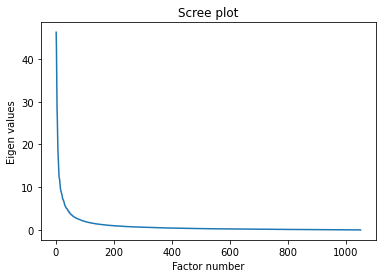

In [41]:
#scree plot
plt.plot(np.arange(1,n_comp+1),eigval)
plt.title("Scree plot")
plt.ylabel("Eigen values")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

In [42]:
#proportion de variance expliquée
prop_eigval=pca.explained_variance_ratio_
pd.DataFrame(prop_eigval.cumsum())

,0
0,0.044501
1,0.085325
2,0.118142
3,0.145570
4,0.170459
...,...
1045,1.000000
1046,1.000000
1047,1.000000
1048,1.000000


In [73]:
pd.DataFrame(prop_eigval.cumsum()).iloc[194]

0    0.764413
Name: 194, dtype: float64

In [43]:
pd.DataFrame(prop_eigval.cumsum())[pd.DataFrame(prop_eigval.cumsum())[0]<0.8].T

,0,1,2,3,4,5,6,7,8,9,...,225,226,227,228,229,230,231,232,233,234
0,0.044501,0.085325,0.118142,0.14557,0.170459,0.191366,0.209335,0.22565,0.239889,0.253155,...,0.792015,0.792837,0.793658,0.794472,0.795286,0.796091,0.796896,0.797696,0.798491,0.799282


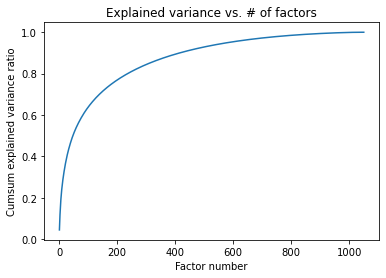

In [44]:
#cumul de variance expliquée
plt.plot(np.arange(1,n_comp+1),np.cumsum(prop_eigval))
plt.title("Explained variance vs. # of factors")
plt.ylabel("Cumsum explained variance ratio")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

On va conserver 235 dimensions pour conserver 80% de la variance. 

In [65]:
# Calcul des composantes principales
pca = decomposition.PCA(235)
features_reduit=pd.DataFrame(pca.fit_transform(features_scaled))
features_reduit

,0,1,2,3,4,5,6,7,8,9,...,225,226,227,228,229,230,231,232,233,234
0,16.500577,-9.898867,6.726766,21.268829,-9.111522,-2.850006,-4.191259,7.921969,-6.059114,1.987472,...,-0.283887,-0.897861,1.040627,-0.599666,0.022709,-2.585724,1.832759,-0.895182,1.108605,-0.405962
1,11.383964,-12.849003,-16.724852,1.694769,-3.936712,-13.463096,29.234463,-8.734372,19.446413,19.967092,...,-0.833737,-2.523593,-0.018941,2.001266,2.964289,0.130504,1.307673,0.515853,-0.943738,0.807973
2,10.174201,-10.553224,-11.390746,-11.471785,-3.123571,-8.225231,7.386229,-1.336850,-0.714988,4.485062,...,-0.942715,-1.104784,-1.425188,-1.138523,-1.870223,0.648394,0.619241,-0.013481,0.583882,0.081645
3,13.559567,-4.614267,-3.374166,9.040167,-7.454728,-11.273223,13.934011,-5.178134,-0.448142,7.388699,...,1.213639,0.305716,-0.479548,0.057699,-0.569960,1.129638,0.677060,-0.242096,-0.358171,-0.860383
4,26.627249,-10.091232,6.909178,21.104395,-10.760799,-16.266136,4.660330,-3.667069,-0.260545,-6.968356,...,-2.637277,-2.781893,0.052156,-2.402588,-2.713748,3.392383,1.301438,-1.367558,-1.793395,0.493148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,14.146963,-11.225107,5.246621,19.130014,-6.355734,-4.215832,-9.057777,5.757314,4.174275,-6.207536,...,0.370047,-0.698310,0.464719,0.557401,-1.710605,1.192266,-0.116375,-1.816212,-2.049739,-1.197027
1046,11.134835,-4.224716,7.469797,6.821539,-1.713025,10.084106,-8.703384,2.826520,7.223361,-1.965633,...,0.932729,-0.326893,2.221090,0.548403,-1.270396,0.577594,1.488400,0.573958,-0.935220,1.283788
1047,22.260387,1.141232,6.555011,16.718362,1.939536,3.111419,-5.822199,8.447978,4.467168,0.503355,...,-1.748121,-3.638716,2.675031,-3.581977,-0.023230,-0.524076,0.905457,-1.860207,0.626740,-0.049345
1048,12.236469,3.515671,7.140280,-2.404265,-2.498301,10.476003,1.755360,6.664267,6.377296,-5.336504,...,-2.579313,2.163887,0.714878,1.968313,-3.675448,3.753132,-0.976091,-0.442093,1.208180,0.213564


In [77]:
features_reduit.to_csv("Data/bovw_cnn_reduit.csv", index = False)

## E - Clustering & Visualisations t-SNE après réduction de dimension <a name=E ></a>

In [66]:
tsne = TSNE(perplexity=40, random_state=5)
tsne_results = tsne.fit_transform(features_reduit)
tsne_proj_red = tsne_results

In [67]:
tsne_results = pd.DataFrame(tsne_results)
tsne_results

,0,1
0,23.953848,16.339537
1,11.980086,17.376278
2,6.484879,17.381260
3,18.386059,20.973843
4,20.474646,25.713737
...,...,...
1045,23.884604,17.425352
1046,0.421092,2.377666
1047,3.227635,2.971291
1048,0.014290,7.892452


In [69]:
from sklearn.cluster import MiniBatchKMeans
kmeans = MiniBatchKMeans(n_clusters=7, random_state=5)
kmeans.fit(features_reduit)

MiniBatchKMeans(n_clusters=7, random_state=5)

In [70]:
kmeans.labels_

array([6, 0, 6, ..., 6, 0, 0])

<AxesSubplot:xlabel='0', ylabel='1'>

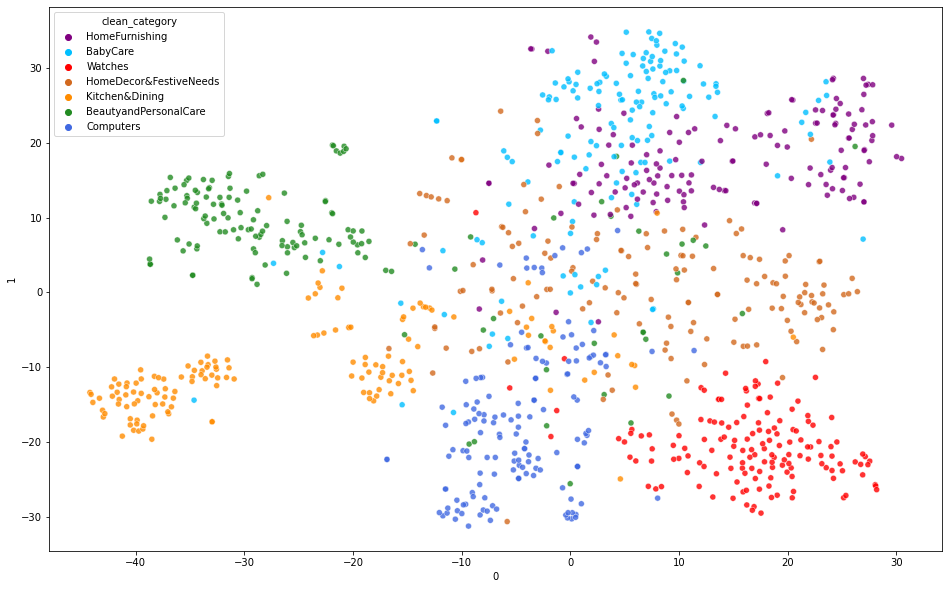

In [68]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=tsne_results[0], y=tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

<AxesSubplot:xlabel='0', ylabel='1'>

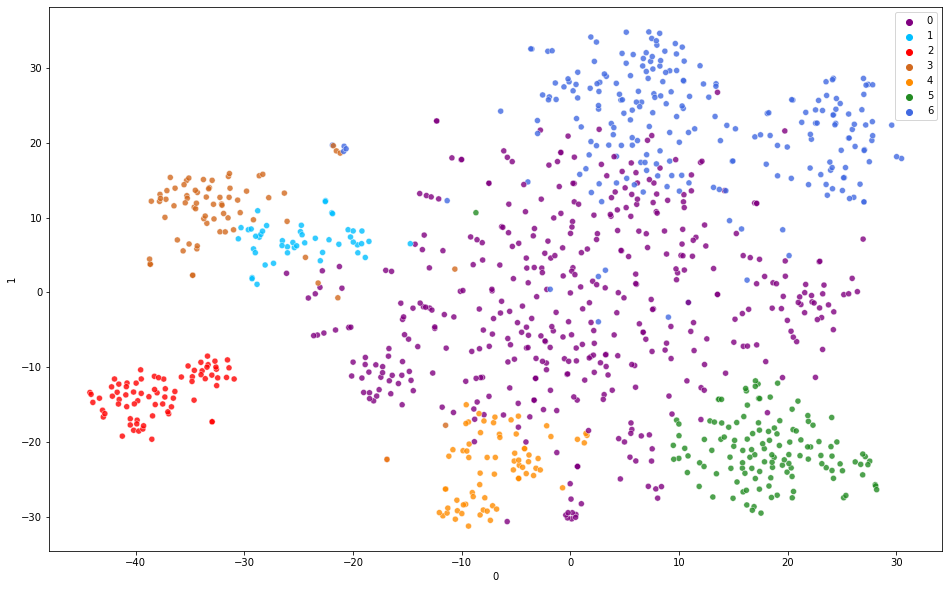

In [71]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=tsne_results[0], y=tsne_results[1],
    hue=kmeans.labels_,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

Même en réduisant les dimensions en passant de 4096 à 235 soit en conservant seulement 5,7% des dimensions on remarque que l'on obtient des résultats très proche, en terme de clustering et sur la visualisation t-SNE, que sur le jeu de données avant réduction de dimension. On peut faire les rapprochements de classes suivants :
- Watches (Rouge) -> Classe 5 (Vert)
- Computers (Jaune) -> Classe 4 (Jaune)
- Kitchen&Dining (Jaune) -> Classe 2 (Rouge), en partie
- BabyCare (Bleu clair) & HomeFurnishing (Violet) -> Classe 6 (Bleu foncé)
- BeautyAndPersonnalCare (Vert) -> Classe 1 (Bleu clair) & Classe 3 (Marron)
- HomeDecor&FestiveNeeds (Marron) -> Une partie de la Classe 0 (Violet)
Ces rapprochements ne sont pas parfaits mais permettent de dégager des tendances. On retrouve aussi les mêmes tendances que l'on a pu observer avant réduction de dimension à savoir :
- BeautyAndPersonnalCare est divisée en 2 classes via notre k-means
Par contre on peut aussi voir que la réduction de dimension à rapprochée des catégories qui ne l'étaient pas auparavant : 
- BabyCare (Bleu clair) & HomeFurnishing (Violet) -> Classe 6 (Bleu foncé)
On retrouve aussi une classe "fourre tout", Classe 0 (Violet), qui contient une grande partie des individus de HomeDecor&FestiveNeeds, une partie de Kitchen&Dining et quelques individus d'autres catégories. <br>
On va maintenant calculer l'Adjusted Rand Score, et le comparer avec celui fait avant réduction de dimension, pour voir dans quelle mesure les indiviuds sont dans les catégories attendues et la différence avec l'avant réduction de dimension.

In [75]:
adjusted_rand_score(categ,kmeans.labels_)

0.2895916607889346

On passe donc de 0.48 à 0.29 on perd donc 0.19 par contre on a quand même un Adjusted Rand Score acceptable tout en ayant réduit nos dimensions de 94%. On va maintenant pouvoir regarder le t-SNE en détail en affichant les images à la place des points pour voir les regroupement qui on été fait.

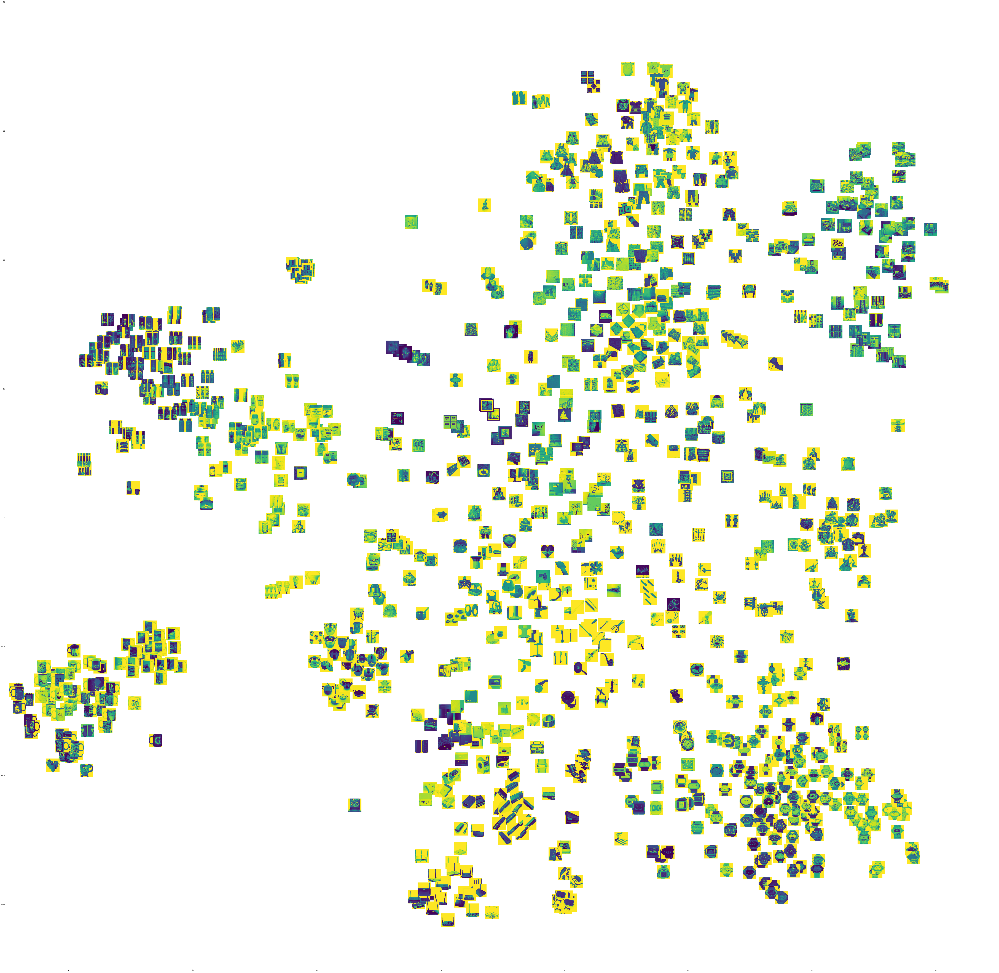

In [74]:
visualize_scatter_with_images(tsne_proj_red, images,xlim=[-45,35],ylim=[-35,40])

On va pouvoir maintenant voir si l'on arrive à de meilleurs résultats en combinant les features d'images et de texte et en réalisant un nouveau clustering.